In [1]:
import pandas as pd
import os
import numpy as np
from tqdm.auto import tqdm
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, cophenet, fcluster
import pycatch22
import numpy as np
import string
from pathlib import Path


c:\Users\cjy8s\miniconda3\envs\utahenv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# 1. Create empty 96-well plate filled with NaN (Python's equivalent to R's NA)
row_names = list(string.ascii_uppercase[:8])  
col_names = [str(i) for i in range(1, 13)]  

plate_layout = pd.DataFrame(np.nan, index=row_names, columns=col_names)

# Define column groups to make assignment cleaner
cols_1_to_8 = [str(i) for i in range(1, 9)]
cols_10_to_12 = ['10', '11', '12']

# 2. Rows A & B, Columns 1-8: WT and KO with generic "compound"
plate_layout.loc['A', cols_1_to_8] = "WT+compound"
plate_layout.loc['B', cols_1_to_8] = "KO+compound"

# 3. Columns 10-12: DMSO controls
# WT controls in the top half (Rows A-D)
plate_layout.loc[['A', 'B', 'C', 'D'], cols_10_to_12] = "WT+DMSO"

# KO controls in the bottom half (Rows E-H)
plate_layout.loc[['E', 'F', 'G', 'H'], cols_10_to_12] = "KO+DMSO"

# Optional: Print to verify
print(plate_layout)

             1            2            3            4            5  \
A  WT+compound  WT+compound  WT+compound  WT+compound  WT+compound   
B  KO+compound  KO+compound  KO+compound  KO+compound  KO+compound   
C          NaN          NaN          NaN          NaN          NaN   
D          NaN          NaN          NaN          NaN          NaN   
E          NaN          NaN          NaN          NaN          NaN   
F          NaN          NaN          NaN          NaN          NaN   
G          NaN          NaN          NaN          NaN          NaN   
H          NaN          NaN          NaN          NaN          NaN   

             6            7            8   9       10       11       12  
A  WT+compound  WT+compound  WT+compound NaN  WT+DMSO  WT+DMSO  WT+DMSO  
B  KO+compound  KO+compound  KO+compound NaN  WT+DMSO  WT+DMSO  WT+DMSO  
C          NaN          NaN          NaN NaN  WT+DMSO  WT+DMSO  WT+DMSO  
D          NaN          NaN          NaN NaN  WT+DMSO  WT+DMSO  WT+DMSO  

C:\Users\cjy8s\AppData\Local\Temp\ipykernel_11300\1641870287.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'WT+compound' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  plate_layout.loc['A', cols_1_to_8] = "WT+compound"
C:\Users\cjy8s\AppData\Local\Temp\ipykernel_11300\1641870287.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'WT+compound' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  plate_layout.loc['A', cols_1_to_8] = "WT+compound"
C:\Users\cjy8s\AppData\Local\Temp\ipykernel_11300\1641870287.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'WT+compound' has dtype incompatible with float64, please explicitly cast to a compatible dtype firs

In [3]:
# Define the phase structure (Group, Phase Name, Time Start, Time End)
phase_structure = [
    [1, "none", 0, 300],
    [1, "backlight", 300, 600],
    [1, "none", 600, 660],
    [2, "backlight strobe", 660, 720],
    [2, "none", 720, 780],
    [2, "backlight strobe", 780, 840],
    [2, "dark", 840, 900],
    [2, "backlight strobe", 900, 960],
    [2, "none", 960, 1260],
    [3, "backlight", 1260, 1560],
    [3, "none", 1560, 1920],
    [4, "cyclic vibration frequency 400", 1920, 2004],
    [4, "none", 2004, 2160],
    [5, "red light", 2160, 2220],
    [5, "none", 2220, 2280],
    [5, "blue light", 2280, 2340],
    [5, "none", 2340, 2400],
    [5, "green light", 2400, 2460],
    [5, "none", 2460, 2520],
    [5, "white light", 2520, 2580],
    [5, "none", 2580, 2700],
    [6, "red light", 2700, 2701],
    [6, "none", 2701, 2761],
    [6, "blue light", 2761, 2762],
    [6, "none", 2762, 2822],
    [6, "green light", 2822, 2823],
    [6, "none", 2823, 2883],
    [6, "white light", 2883, 3030],
    [7, "vibration frequency 200", 3030, 3031],
    [7, "none", 3031, 3090],
    [7, "vibration frequency 300", 3090, 3091],
    [7, "none", 3091, 3150],
    [7, "vibration frequency 600", 3150, 3151],
    [7, "none", 3151, 3210],
    [8, "cyclic vibration frequency 600", 3210, 3302],
    [8, "none", 3302, 3480]
]

time_frame = pd.DataFrame(phase_structure, columns=["Group", "Phase", "Start", "End"])

In [4]:
# 1. Setup metadata dictionaries
rows, cols = 'ABCDEFGH', range(1, 13)
coords = [f"{r}{c}" for r in rows for c in cols]
loc_to_condition = dict(zip(range(1, 97), plate_layout.values.flatten()))
loc_to_coord = dict(zip(range(1, 97), coords))

# 2. Process Files (Recursive walk + initial cleaning)
base_path = Path("C:/Users/cjy8s/OneDrive - Baylor College of Medicine/UofU/Python Version/Workspace/Input/Test data_zebrabox/Exp1")
all_dfs = []

# Iterate through subdirectories
dirs_to_search = [base_path] + [f for f in base_path.rglob('*') if f.is_dir()]

for folder in dirs_to_search:
    files = [f for f in folder.glob('*') if f.suffix in ['.csv', '.xls', '.xlsx']]
    if not files: continue
    
    # Load and combine files in this folder
    temp_df = pd.concat([
        pd.read_csv(f, sep='\t', low_memory=False, dtype={'data1': str}, keep_default_na=False) if f.suffix != '.xlsx' 
        else pd.read_excel(f, dtype={'data1': str}, keep_default_na=False)
        for f in files
    ])
    
    # Cleaning & Feature Engineering in one pass
    temp_df = temp_df[temp_df['time'] > 0][['time', 'location', 'data1']].copy()
    temp_df['loc_id'] = temp_df['location'].str.extract(r'(\d+)').astype(int)
    temp_df['Condition'] = temp_df['loc_id'].map(loc_to_condition)
    temp_df['loc_coord'] = temp_df['loc_id'].map(loc_to_coord)
    temp_df['time_sec'] = (temp_df['time'] / 1_000_000).astype(int)
    
    all_dfs.append(temp_df)

# 3. Merge & Aggregate
merged_df = pd.concat(all_dfs, keys=range(1, len(all_dfs)+1), names=['plate']).reset_index()

merged_df['pxl_diff'] = pd.to_numeric(merged_df['data1'], errors='coerce')

binned_df = (merged_df
    .groupby(['plate', 'Condition', 'loc_coord', 'location', 'time_sec'])['pxl_diff']
    .sum()
    .reset_index()
    .sort_values(['plate', 'time_sec', 'location'])
)

# 4. Final Join (The "Causal Pivot")
binned_df = pd.merge_asof(
    binned_df.sort_values('time_sec').assign(time_sec=lambda x: x['time_sec'].astype(np.int64)),
    time_frame[['End', 'Phase', 'Group']].sort_values('End').assign(End=lambda x: x['End'].astype(np.int64)),
    left_on='time_sec',
    right_on='End',
    direction='forward'
).drop(columns='End')

# remove empty cells in the plate from the dataframe
binned_df = binned_df[
    (binned_df['Condition'].notna()) & 
    (binned_df['Condition'] != '')
]
full_df = binned_df.sort_values(by=['plate', 'time_sec', 'location']).reset_index(drop=True)
full_df[['Genotype', 'Drug']] = full_df['Condition'].str.split('+', expand=True)


Pre-building base feature sets (this only happens once)...
  catch22 features:     (40, 176)
  catch24 features:     (40, 192)
  Custom features:      (40, 91)

Starting Hyperparameter Grid Search (Evaluating 160 combinations)...


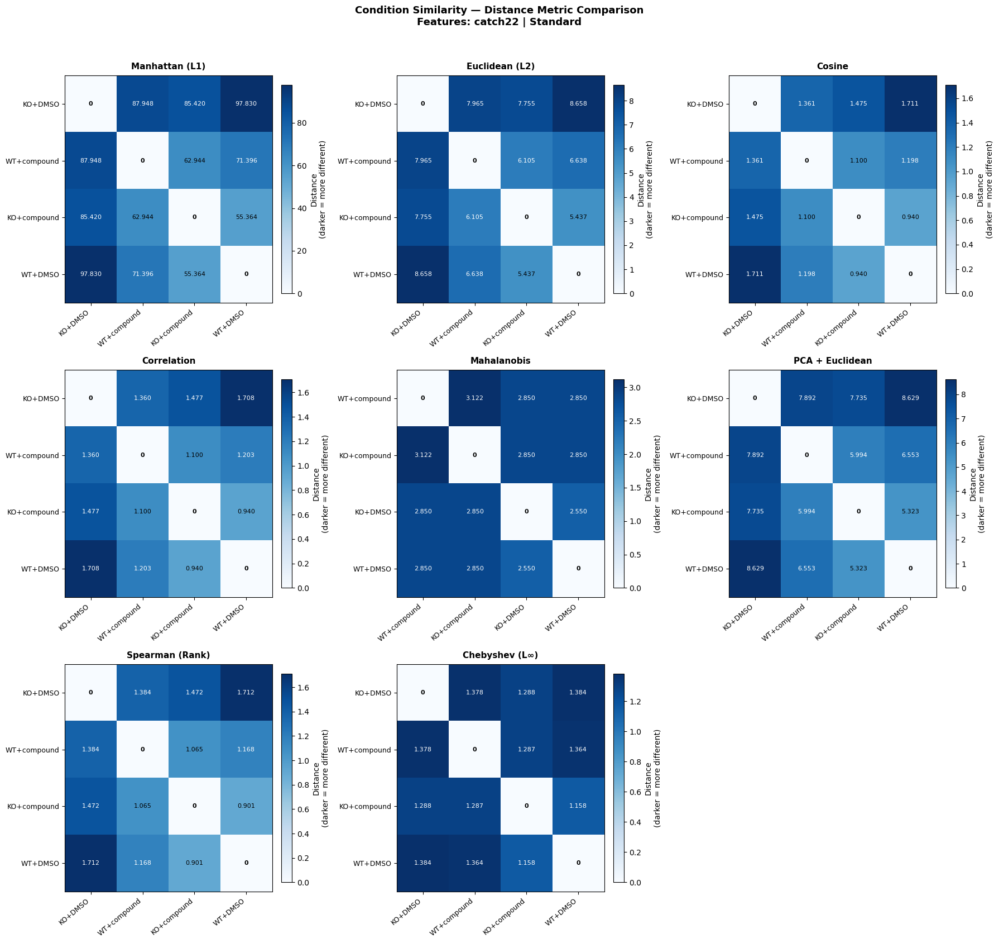

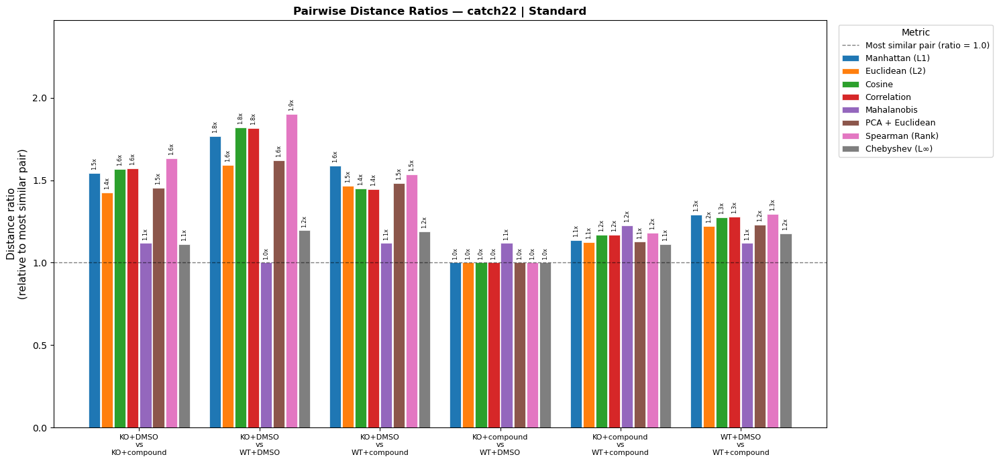

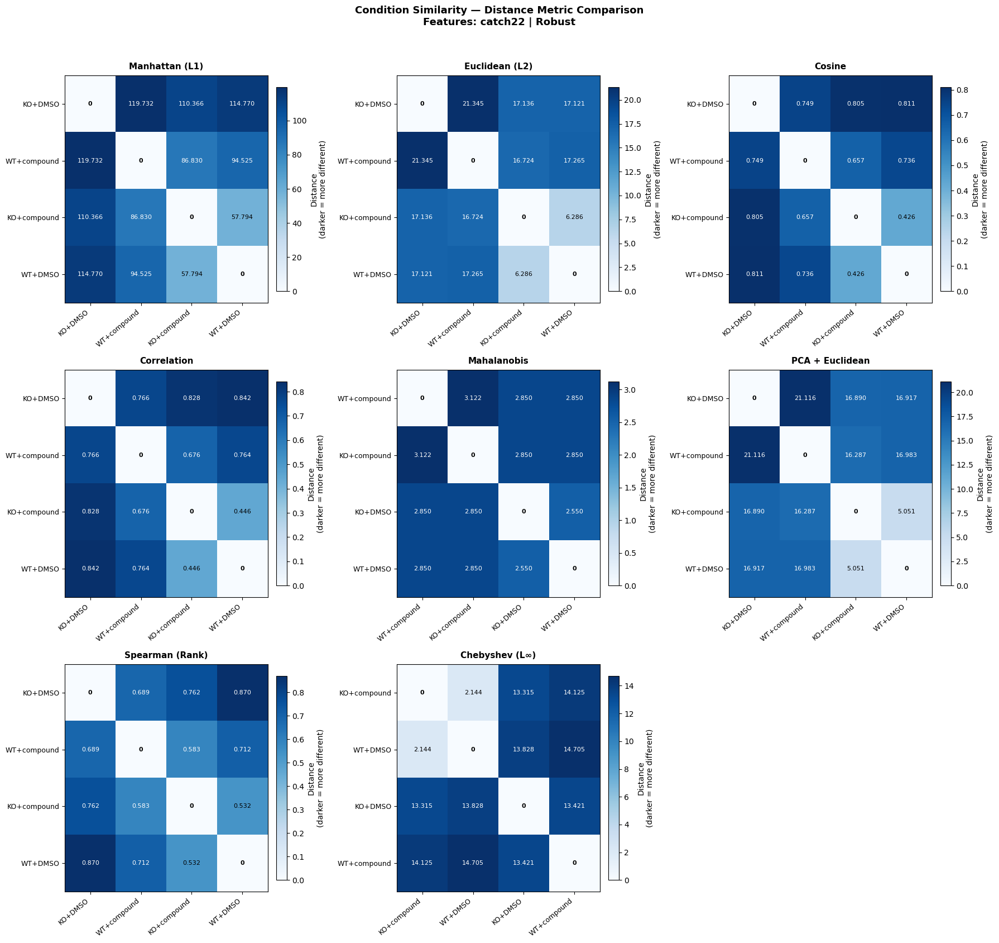

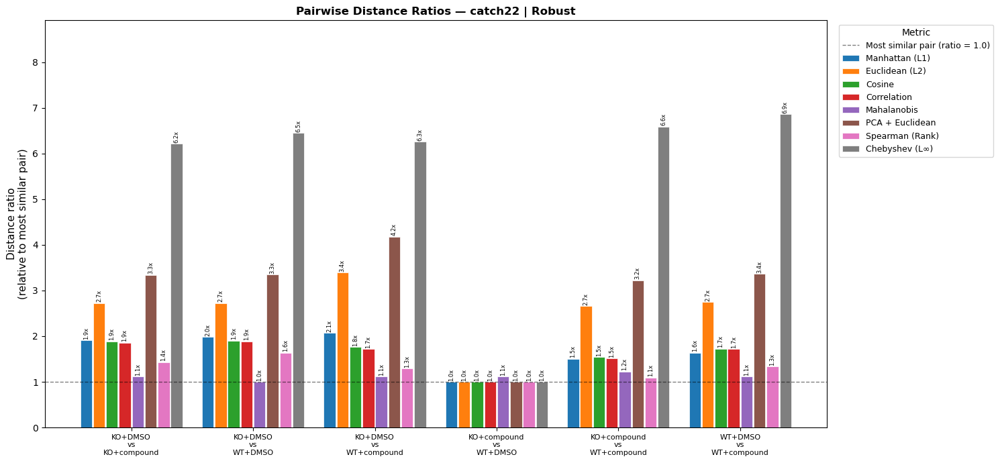

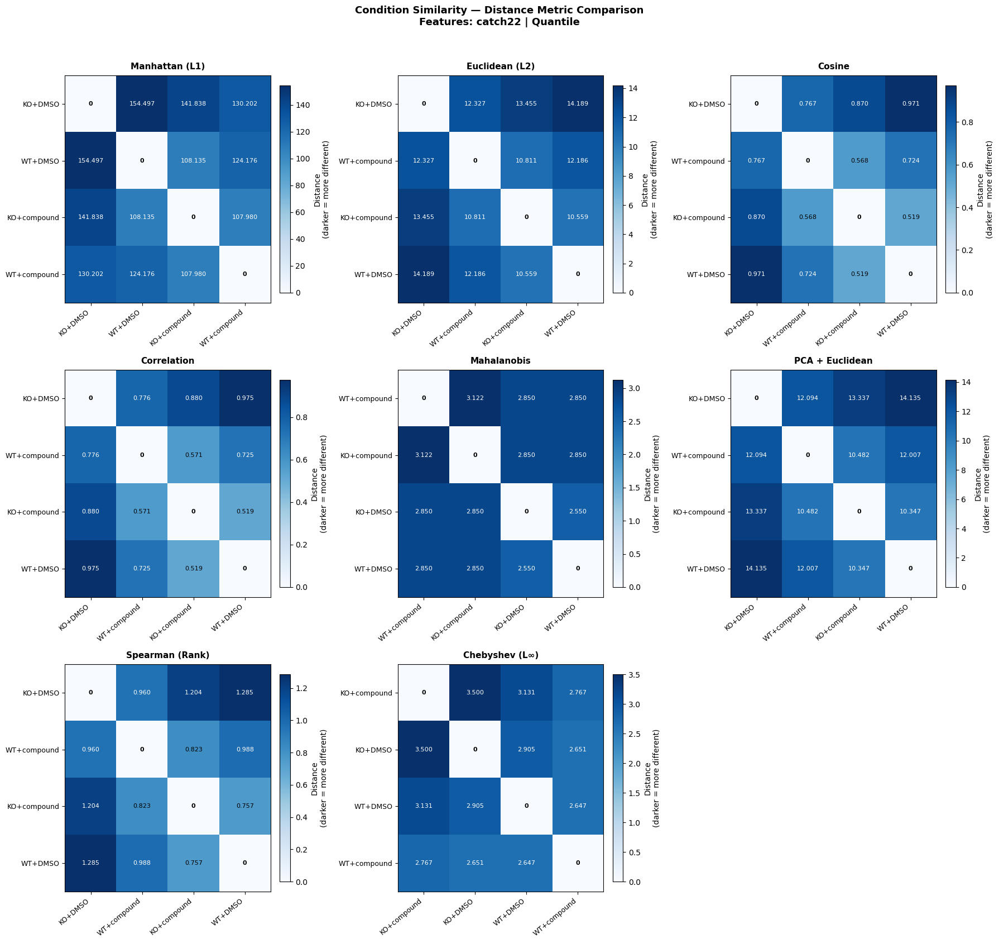

...

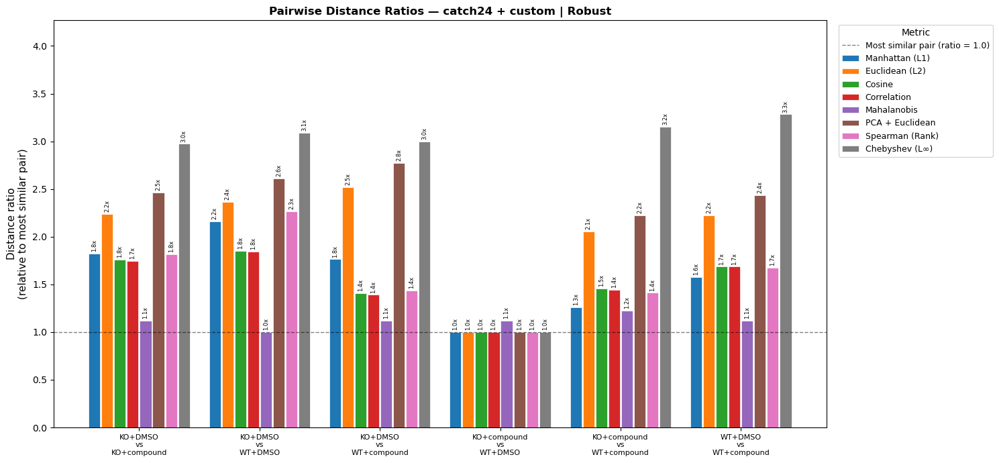

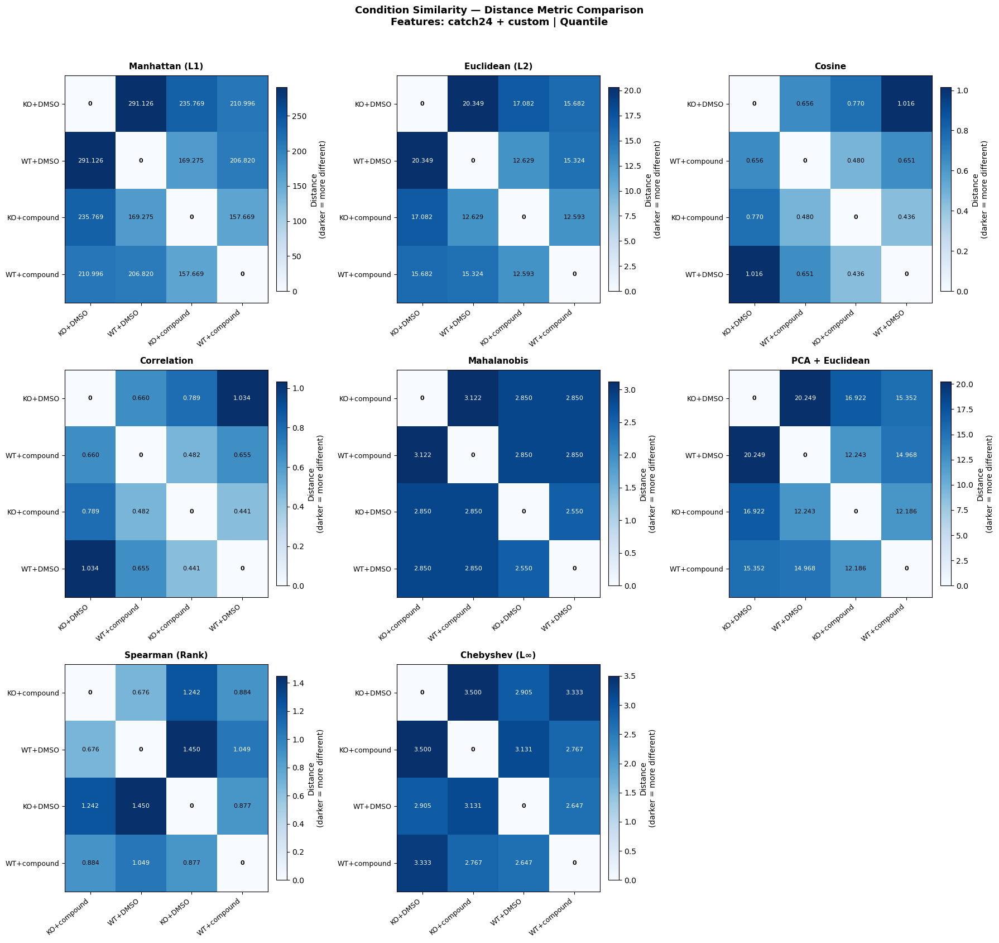

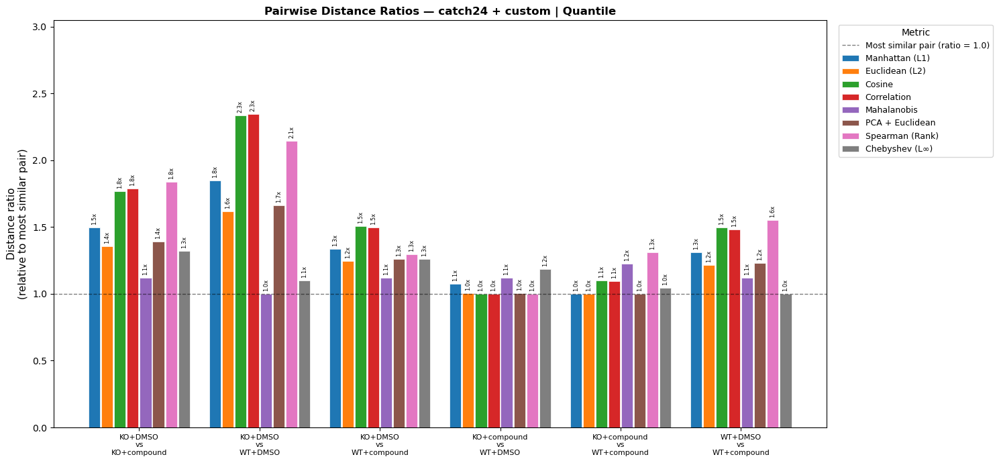

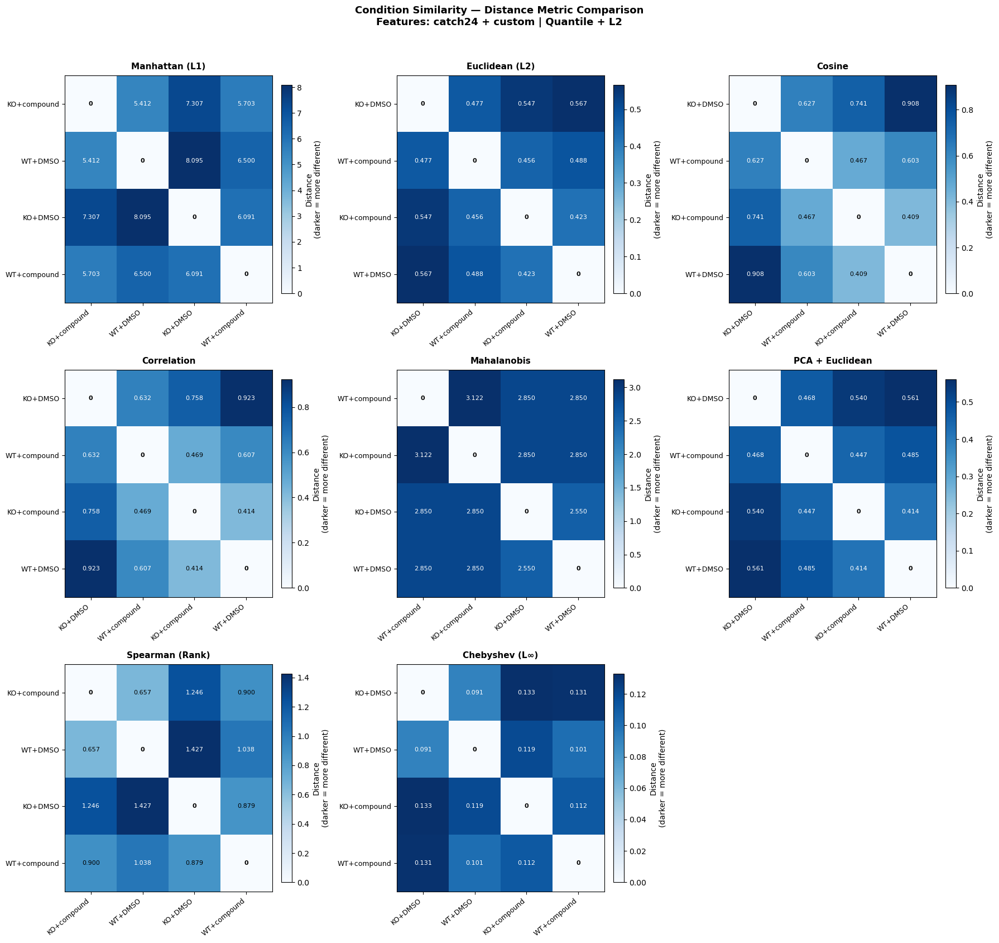

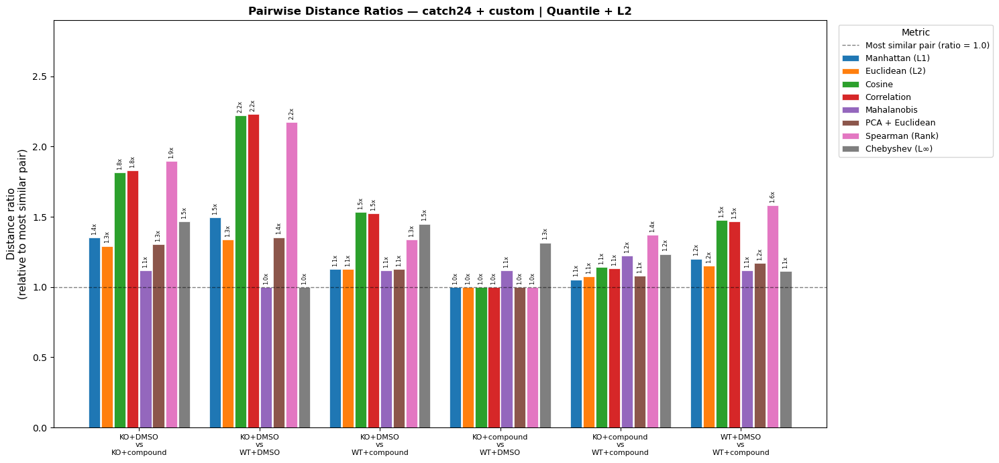



GRAND MASTER LEADERBOARD: TOP 25 COMBINATIONS
Goal: Rescue Ratio ~ 1.0 | Disease Ratio = Maximized
         Feature Set       Pipeline           Metric  Rescue Ratio  Disease Ratio  Separation Score
0            catch24         Robust   Chebyshev (L∞)         1.000          6.450             6.450
1            catch22         Robust   Chebyshev (L∞)         1.000          6.450             6.450
2             custom         Robust  Spearman (Rank)         1.000          3.913             3.913
3             custom  Quantile + L2           Cosine         1.000          3.836             3.836
4             custom  Quantile + L2      Correlation         1.000          3.634             3.634
5             custom       Quantile           Cosine         1.000          3.395             3.395
6            catch22         Robust  PCA + Euclidean         1.000          3.350             3.350
7             custom  Quantile + L2  Spearman (Rank)         1.000          3.309             3.309

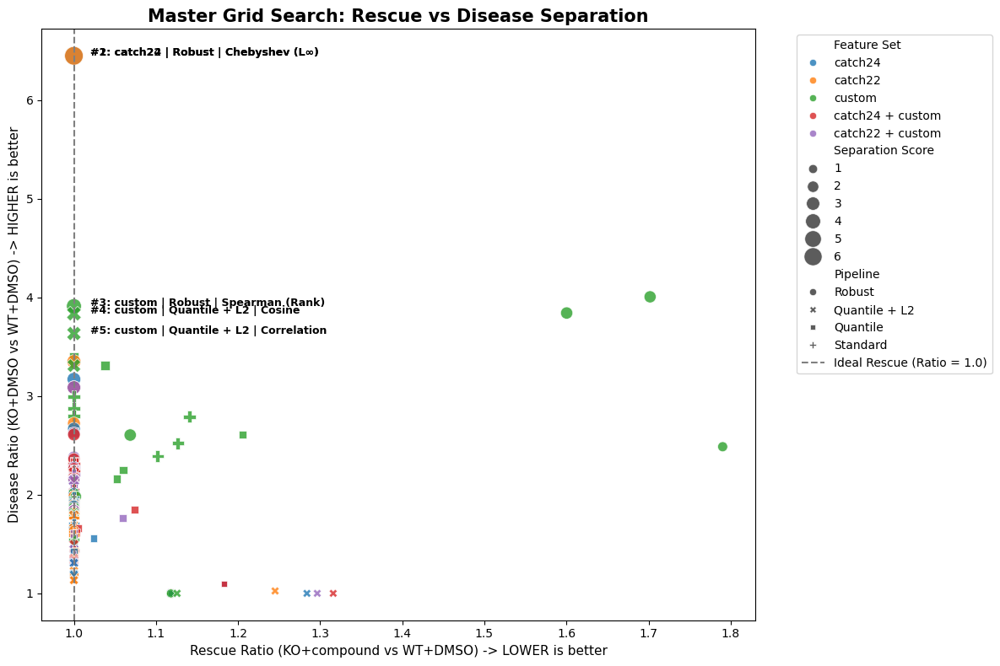



Evaluating biological drivers using the absolute #1 ranked framework:
[catch24 | Robust | Chebyshev (L∞)]

TOP DRIVING BIOLOGICAL FEATURES: KO+DMSO vs WT+DMSO
Extraction Pipeline: Robust Scaler | L2 Norm: False
Difference: 1.629 standard units
Feature:    SB_MotifThree_quantile_hh_Phase2
Meaning:    High-high motif entropy (3-quantile)

Difference: 1.319 standard units
Feature:    SB_TransitionMatrix_3ac_sumdiagcov_Phase6
Meaning:    Transition matrix diagonal covariance

Difference: 1.286 standard units
Feature:    MD_hrv_classic_pnn40_Phase2
Meaning:    HRV: consecutive differences > 40ms

Difference: 1.263 standard units
Feature:    SB_MotifThree_quantile_hh_Phase6
Meaning:    High-high motif entropy (3-quantile)

Difference: 1.226 standard units
Feature:    DN_Mean_Phase5
Meaning:    DN_Mean


TOP DRIVING BIOLOGICAL FEATURES: WT+DMSO vs WT+compound
Extraction Pipeline: Robust Scaler | L2 Norm: False
Difference: 2.180 standard units
Feature:    CO_f1ecac_Phase2
Meaning:    First 1

In [5]:
# ============================================================
# Condition Similarity Analysis
# Catch24 + custom behavioral features -> condition similarity heatmaps
# comparing multiple distance metrics side by side
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import pycatch22
from itertools import combinations
from scipy.spatial.distance import cdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import StandardScaler, RobustScaler, QuantileTransformer, normalize
from sklearn.decomposition import PCA
from scipy.stats import rankdata


# ==========================================
# CATCH24 FEATURE DESCRIPTIONS
# ==========================================

CATCH24_DESCRIPTIONS = {
    "DN_HistogramMode_5":                           "Distribution mode (5 bins)",
    "DN_HistogramMode_10":                          "Distribution mode (10 bins)",
    "CO_f1ecac":                                    "First 1/e autocorrelation crossing",
    "CO_FirstMin_ac":                               "First autocorrelation minimum",
    "CO_HistogramAMI_even_2_5":                     "Auto-mutual information (lag 2, 5 bins)",
    "CO_trev_1_num":                                "Time-reversibility statistic (lag 1)",
    "CO_Embed2_Dist_tau_d_expfit_meandiff":         "Embedding distance exponential fit",
    "IN_AutoMutualInfoStats_40_gaussian_fmmi":      "First min. of auto-mutual information",
    "MD_hrv_classic_pnn40":                         "HRV: consecutive differences > 40ms",
    "SB_BinaryStats_mean_longstretch1":             "Mean longest above-mean stretch",
    "SB_BinaryStats_diff_longstretch0":             "Longest flat (unchanged) stretch",
    "SB_MotifThree_quantile_hh":                    "High-high motif entropy (3-quantile)",
    "SB_TransitionMatrix_3ac_sumdiagcov":           "Transition matrix diagonal covariance",
    "SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1":       "DFA scaling exponent",
    "SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1": "Long-range dependence (DFA range)",
    "SP_Summaries_welch_rect_area_5_1":             "Power in lowest 20% of frequencies",
    "SP_Summaries_welch_rect_centroid":             "Welch power spectrum centroid",
    "FC_LocalSimple_mean1_tauresrat":               "Local mean forecast error (lag 1)",
    "FC_LocalSimple_mean3_stderr":                  "Local mean forecast std error (lag 3)",
    "DN_OutlierInclude_p_001_mdrmd":                "Positive outlier median (0.1%)",
    "DN_OutlierInclude_n_001_mdrmd":                "Negative outlier median (0.1%)",
    "PD_PeriodicityWang_th0_01":                    "Periodicity (Wang method)",
    "mean":                                         "Mean (catch24)",
    "variance":                                     "Variance (catch24)",
}


# ==========================================
# 1. UTILITIES
# ==========================================

def _apply_transform(ts, transform):
    if transform == 'sqrt':
        return np.sqrt(np.clip(ts, 0, None))
    elif transform == 'log1p':
        return np.log1p(np.clip(ts, 0, None))
    return ts.copy()


def _clean(fm):
    """Replace inf, drop all-NaN cols, fill remaining NaN, drop near-zero variance."""
    fm = fm.copy()
    fm.replace([np.inf, -np.inf], np.nan, inplace=True)
    fm.dropna(axis=1, how='all', inplace=True)
    fm.fillna(0, inplace=True)
    fm = fm.loc[:, fm.var(axis=0) >= 1e-6]
    return fm


def _get_bouts(active_mask):
    """Returns list of (start, duration) tuples for contiguous True runs."""
    bouts, in_bout, start = [], False, 0
    for i, val in enumerate(active_mask):
        if val and not in_bout:
            in_bout, start = True, i
        elif not val and in_bout:
            in_bout = False
            bouts.append((start, i - start))
    if in_bout:
        bouts.append((start, len(active_mask) - start))
    return bouts


# ==========================================
# 2. CATCH FEATURES
# ==========================================

def build_catch_features(full_df, transform='sqrt', catch24=True):
    sorted_df       = full_df.sort_values(by=['loc_coord', 'Group', 'time_sec'])
    dummy           = pycatch22.catch22_all([1.0, 2.0, 3.0], catch24=catch24)
    base_feat_names = dummy['names']
    col_names       = [f"{fname}_Phase{p+1}"
                       for p in range(8) for fname in base_feat_names]

    all_features, subject_ids, true_labels = [], [], []

    for subject, subj_df in sorted_df.groupby('loc_coord'):
        subject_ids.append(subject)
        true_labels.append(subj_df['Condition'].iloc[0])
        feats = []
        for _, phase_df in subj_df.groupby('Group'):
            ts = _apply_transform(phase_df['pxl_diff'].values.astype(float), transform)
            feats.extend(pycatch22.catch22_all(list(ts), catch24=catch24)['values'])
        all_features.append(feats)

    fm = _clean(pd.DataFrame(all_features, index=subject_ids, columns=col_names))
    label = 'catch24' if catch24 else 'catch22'
    print(f"  {label} features:     {fm.shape}")
    return fm, subject_ids, true_labels


# ==========================================
# 3. CUSTOM BEHAVIORAL FEATURES
# ==========================================

def build_custom_features(full_df, transform='sqrt'):
    sorted_df       = full_df.sort_values(by=['loc_coord', 'Group', 'time_sec'])
    phase_label_map = (full_df[['Group', 'Phase']]
                       .drop_duplicates()
                       .set_index('Group')['Phase']
                       .to_dict())

    all_records, subject_ids, true_labels = [], [], []

    for subject, subj_df in sorted_df.groupby('loc_coord'):
        subject_ids.append(subject)
        true_labels.append(subj_df['Condition'].iloc[0])
        row = {}

        phases      = {}
        phase_means = {}
        for group_num, phase_df in subj_df.groupby('Group'):
            ts    = _apply_transform(phase_df['pxl_diff'].values.astype(float), transform)
            label = phase_label_map.get(group_num, str(group_num))
            phases[group_num]      = (ts, label)
            phase_means[group_num] = ts.mean()

        # A) Phase-difference
        label_means = {}
        for gn, (ts, lbl) in phases.items():
            label_means.setdefault(lbl, []).append(ts.mean())
        label_means = {k: np.mean(v) for k, v in label_means.items()}
        for (l1, m1), (l2, m2) in combinations(label_means.items(), 2):
            row[f"phase_diff_{l1}_vs_{l2}"] = m1 - m2

        # B) Bout-level
        for group_num, (ts, lbl) in phases.items():
            bouts  = _get_bouts(ts > 0)
            prefix = f"bout_Phase{group_num}"
            row[f"{prefix}_count"]    = len(bouts)
            row[f"{prefix}_mean_dur"] = np.mean([b[1] for b in bouts]) if bouts else 0
            row[f"{prefix}_max_dur"]  = np.max([b[1] for b in bouts])  if bouts else 0
            row[f"{prefix}_mean_amp"] = (np.mean([ts[b[0]:b[0]+b[1]].mean()
                                          for b in bouts]) if bouts else 0)
            if len(bouts) > 1:
                ibi = [bouts[i+1][0] - (bouts[i][0] + bouts[i][1])
                       for i in range(len(bouts) - 1)]
                row[f"{prefix}_mean_ibi"] = np.mean(ibi)
            else:
                row[f"{prefix}_mean_ibi"] = np.nan

        # C) Frequency domain
        for group_num, (ts, lbl) in phases.items():
            prefix = f"fft_Phase{group_num}"
            n      = len(ts)
            if n < 4:
                for k in ['dom_freq', 'low_power', 'mid_power',
                          'high_power', 'spectral_entropy']:
                    row[f"{prefix}_{k}"] = 0
                continue
            freqs = np.fft.rfftfreq(n)
            power = np.abs(np.fft.rfft(ts))**2
            total = power.sum() + 1e-12
            dom_idx = np.argmax(power[1:]) + 1
            row[f"{prefix}_dom_freq"] = freqs[dom_idx]
            third = max(1, len(freqs) // 3)
            row[f"{prefix}_low_power"]        = power[1:third+1].sum() / total
            row[f"{prefix}_mid_power"]        = power[third+1:2*third+1].sum() / total
            row[f"{prefix}_high_power"]       = power[2*third+1:].sum() / total
            p_norm = power[1:] / total
            p_norm = p_norm[p_norm > 0]
            row[f"{prefix}_spectral_entropy"] = -np.sum(p_norm * np.log(p_norm))

        # D) Habituation index
        label_groups = {}
        for gn, (_, lbl) in phases.items():
            label_groups.setdefault(lbl, []).append(gn)
        for lbl, group_nums in label_groups.items():
            if len(group_nums) < 2:
                continue
            means = [phase_means[gn] for gn in sorted(group_nums)]
            slope = np.polyfit(np.arange(len(means), dtype=float), means, 1)[0]
            row[f"habituation_{lbl}"] = slope

        all_records.append(row)

    fm = _clean(pd.DataFrame(all_records, index=subject_ids))
    print(f"  Custom features:      {fm.shape}")
    return fm, subject_ids, true_labels


# ==========================================
# 4. CONDITION CENTROID DISTANCES
# ==========================================

def compute_condition_similarity(fm, true_labels, metric='cityblock', transform_strategy='standard', l2_norm=False):
    
    if transform_strategy == 'robust':
        scaled = RobustScaler().fit_transform(fm.values)
    elif transform_strategy == 'quantile':
        scaled = QuantileTransformer(output_distribution='normal', 
                                     n_quantiles=min(50, len(fm))).fit_transform(fm.values)
    else: 
        scaled = StandardScaler().fit_transform(fm.values)
    
    if l2_norm:
        scaled = normalize(scaled, norm='l2') 

    labels_arr = np.array(true_labels)
    conditions = sorted(set(true_labels))
    centroids  = np.array([scaled[labels_arr == c].mean(axis=0) 
                            for c in conditions])

    if metric == 'mahalanobis':
        try:
            VI = np.linalg.pinv(np.cov(scaled.T))
            dist_matrix = cdist(centroids, centroids, metric='mahalanobis', VI=VI)
        except Exception:
            dist_matrix = cdist(centroids, centroids, metric='euclidean')
        
    elif metric == 'pca_euclidean':
        n_samples = scaled.shape[0]
        n_components = 0.95 if n_samples > 20 else min(n_samples, scaled.shape[1])
        try:
            pca_scaled = PCA(n_components=n_components).fit_transform(scaled)
        except Exception:
            pca_scaled = PCA(n_components=min(5, n_samples)).fit_transform(scaled)
            
        pca_centroids = np.array([pca_scaled[labels_arr == c].mean(axis=0) 
                                  for c in conditions])
        dist_matrix = cdist(pca_centroids, pca_centroids, metric='euclidean')
        
    elif metric == 'spearman':
        ranked_centroids = np.array([rankdata(c) for c in centroids])
        dist_matrix = cdist(ranked_centroids, ranked_centroids, metric='correlation')
        
    else:
        dist_matrix = cdist(centroids, centroids, metric=metric)
        
    cond_dist_df = pd.DataFrame(dist_matrix, index=conditions, columns=conditions)
    return scaled, cond_dist_df, conditions


# ==========================================
# 5. HEATMAP & PLOTTING FUNCTIONS
# ==========================================

def _single_heatmap(ax, cond_dist_df, metric_name):
    mat = cond_dist_df.values.copy()
    np.fill_diagonal(mat, 0.0)
    Z         = linkage(squareform(mat), method='average')
    order     = dendrogram(Z, no_plot=True)['leaves']
    reordered = pd.DataFrame(mat, index=cond_dist_df.index,
                             columns=cond_dist_df.columns).iloc[order, order]
    conditions = list(reordered.columns)
    n          = len(conditions)
    
    vmax = np.max(reordered.values[~np.eye(n, dtype=bool)])
    if vmax <= 1e-6: vmax = 1.0 

    im = ax.imshow(reordered.values, cmap=sns.color_palette("Blues", as_cmap=True), vmin=0, vmax=vmax, aspect='auto')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Distance\n(darker = more different)')

    ax.set_xticks(range(n))
    ax.set_xticklabels(conditions, rotation=40, ha='right', fontsize=9)
    ax.set_yticks(range(n))
    ax.set_yticklabels(conditions, fontsize=9)
    ax.set_title(metric_name, fontsize=11, fontweight='bold', pad=8)

    for r in range(n):
        for c in range(n):
            val = reordered.values[r, c]
            ax.text(c, r, '0' if r == c else f'{val:.3f}', ha='center', va='center', fontsize=8,
                    color='white' if val > vmax * 0.65 else 'black', fontweight='bold' if r == c else 'normal')

    return reordered


def get_metric_label(metric):
    labels = {
        'cityblock':     'Manhattan (L1)',
        'euclidean':     'Euclidean (L2)',
        'cosine':        'Cosine',
        'chebyshev':     'Chebyshev (L∞)',
        'correlation':   'Correlation',
        'mahalanobis':   'Mahalanobis',
        'pca_euclidean': 'PCA + Euclidean',
        'spearman':      'Spearman (Rank)'
    }
    return labels.get(metric, metric)


def plot_metric_comparison(fm, true_labels, feature_label, metrics=None, transform_strategy='standard', l2_norm=False, show_plot=True):
    if not show_plot: return

    if metrics is None:
        metrics = ['cityblock', 'euclidean', 'cosine', 'correlation', 
                   'mahalanobis', 'pca_euclidean', 'spearman', 'chebyshev']

    n_metrics = len(metrics)
    ncols     = min(n_metrics, 3) 
    nrows     = int(np.ceil(n_metrics / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 5.5))
    axes = np.array(axes).flatten()

    for ax in axes[n_metrics:]:
        ax.axis('off')

    for i, metric in enumerate(metrics):
        _, cond_dist_df, _ = compute_condition_similarity(
            fm, true_labels, metric=metric, transform_strategy=transform_strategy, l2_norm=l2_norm)
        reordered = _single_heatmap(axes[i], cond_dist_df, get_metric_label(metric))

    fig.suptitle(f"Condition Similarity — Distance Metric Comparison\nFeatures: {feature_label}", fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


def plot_distance_ratios(fm, true_labels, feature_label, metrics=None, transform_strategy='standard', l2_norm=False, show_plot=True):
    if metrics is None:
        metrics = ['cityblock', 'euclidean', 'cosine', 'correlation', 
                   'mahalanobis', 'pca_euclidean', 'spearman', 'chebyshev']

    all_ratios   = {}
    pair_labels  = None

    for metric in metrics:
        _, cond_dist_df, conditions = compute_condition_similarity(
            fm, true_labels, metric=metric, transform_strategy=transform_strategy, l2_norm=l2_norm)

        mat = cond_dist_df.values.copy()
        np.fill_diagonal(mat, 0.0)

        pairs  = list(combinations(range(len(conditions)), 2))
        dists  = np.array([mat[i, j] for i, j in pairs])
        labels = [f"{conditions[i]}\nvs\n{conditions[j]}" for i, j in pairs]

        if pair_labels is None:
            pair_labels = labels

        min_dist = dists[dists > 0].min() if (dists > 0).any() else 1.0
        ratios   = dists / min_dist
        all_ratios[metric] = ratios

    if not show_plot:
        return pair_labels, all_ratios

    n_pairs   = len(pair_labels)
    n_metrics = len(metrics)
    x         = np.arange(n_pairs)
    width     = 0.85 / n_metrics
    colors    = sns.color_palette("tab10", n_metrics) 

    fig, ax = plt.subplots(figsize=(max(14, n_pairs * 2.5), 7))

    for i, metric in enumerate(metrics):
        offsets = x + (i - n_metrics / 2 + 0.5) * width
        bars    = ax.bar(offsets, all_ratios[metric], width=width * 0.9, color=colors[i],
                         label=get_metric_label(metric), edgecolor='white', linewidth=0.5)
        
        for bar, val in zip(bars, all_ratios[metric]):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02,
                    f'{val:.1f}x', ha='center', va='bottom', fontsize=6, color='black', rotation=90)

    ax.axhline(1.0, color='black', linewidth=1.0, linestyle='--', alpha=0.5, label='Most similar pair (ratio = 1.0)')
    ax.set_xticks(x)
    ax.set_xticklabels(pair_labels, fontsize=8)
    ax.set_ylabel("Distance ratio\n(relative to most similar pair)", fontsize=11)
    ax.set_title(f"Pairwise Distance Ratios — {feature_label}", fontsize=12, fontweight='bold')
    ax.legend(title='Metric', fontsize=9, bbox_to_anchor=(1.01, 1), loc='upper left')
    ax.set_ylim(0, max(v.max() for v in all_ratios.values()) * 1.3)
    plt.tight_layout()
    plt.show()
    
    return pair_labels, all_ratios


# ==========================================
# 6. FEATURE EXTRACTION TOOL
# ==========================================

def extract_top_driving_features(fm, true_labels, cond_A, cond_B, transform_strategy, l2_norm, top_k=5):
    """
    Extracts the exact features driving the largest absolute median differences 
    between two conditions, using the optimal scaling strategy found during grid search.
    """
    if transform_strategy == 'robust':
        scaled = RobustScaler().fit_transform(fm.values)
    elif transform_strategy == 'quantile':
        scaled = QuantileTransformer(output_distribution='normal', 
                                     n_quantiles=min(50, len(fm))).fit_transform(fm.values)
    else: 
        scaled = StandardScaler().fit_transform(fm.values)
    
    if l2_norm:
        scaled = normalize(scaled, norm='l2')

    scaled_df = pd.DataFrame(scaled, columns=fm.columns)
    scaled_df['Condition'] = true_labels
    
    if cond_A not in scaled_df['Condition'].values or cond_B not in scaled_df['Condition'].values:
        print(f"\n[Warning] Could not extract features: '{cond_A}' or '{cond_B}' not found in labels.")
        return

    centroid_A = scaled_df[scaled_df['Condition'] == cond_A].drop(columns='Condition').median(axis=0)
    centroid_B = scaled_df[scaled_df['Condition'] == cond_B].drop(columns='Condition').median(axis=0)
    
    abs_diff = np.abs(centroid_A - centroid_B)
    top_features = abs_diff.sort_values(ascending=False).head(top_k)
    
    print(f"\n{'='*70}")
    print(f"TOP DRIVING BIOLOGICAL FEATURES: {cond_A} vs {cond_B}")
    print(f"Extraction Pipeline: {transform_strategy.capitalize()} Scaler | L2 Norm: {l2_norm}")
    print(f"{'='*70}")
    for feat, diff in top_features.items():
        base_feat = feat.rsplit('_Phase', 1)[0]
        desc = CATCH24_DESCRIPTIONS.get(base_feat, base_feat)
        print(f"Difference: {diff:.3f} standard units")
        print(f"Feature:    {feat}")
        print(f"Meaning:    {desc}\n")


if __name__ == "__main__":

    # ----- GRID SEARCH CONFIG --------------------------------------------
    TRANSFORM = 'log1p'   
    
    # Toggle to True if you want to see all the individual heatmaps/bars
    # Set to False to just run the grid search silently and output the final results
    SHOW_INTERMEDIATE_PLOTS = True 

    METRICS = [
        'cityblock', 'euclidean', 'cosine', 'correlation', 
        'mahalanobis', 'pca_euclidean', 'spearman', 'chebyshev'
    ]

    PIPELINES = [
        {"name": "Standard",      "transform": "standard", "l2": False},
        {"name": "Robust",        "transform": "robust",   "l2": False},
        {"name": "Quantile",      "transform": "quantile", "l2": False},
        {"name": "Quantile + L2", "transform": "quantile", "l2": True}
    ]
    # ---------------------------------------------------------------------

    print("Pre-building base feature sets (this only happens once)...")
    fm_c22, c22_ids, true_labels = build_catch_features(full_df, transform=TRANSFORM, catch24=False)
    fm_c24, _, _ = build_catch_features(full_df, transform=TRANSFORM, catch24=True)
    fm_cust, _, _ = build_custom_features(full_df, transform=TRANSFORM)

    # All logical combinations of feature sets
    FEATURE_COMBOS = [
        ("catch22", fm_c22),
        ("catch24", fm_c24),
        ("custom", fm_cust),
        ("catch22 + custom", _clean(pd.concat([fm_c22, fm_cust], axis=1))),
        ("catch24 + custom", _clean(pd.concat([fm_c24, fm_cust], axis=1)))
    ]

    evaluation_results = []
    fm_map = {} # Store matrices to retrieve the winning one later

    print("\nStarting Hyperparameter Grid Search (Evaluating 160 combinations)...")
    
    for feature_label, fm in FEATURE_COMBOS:
        fm_map[feature_label] = fm # Save for extraction later

        for pipe in PIPELINES:
            dynamic_label = f"{feature_label} | {pipe['name']}"
            
            # Optional: Generate intermediate plots if toggled
            plot_metric_comparison(fm, true_labels, feature_label=dynamic_label, metrics=METRICS, 
                                   transform_strategy=pipe['transform'], l2_norm=pipe['l2'], show_plot=SHOW_INTERMEDIATE_PLOTS)

            pair_labels, all_ratios = plot_distance_ratios(fm, true_labels, feature_label=dynamic_label, metrics=METRICS, 
                                                           transform_strategy=pipe['transform'], l2_norm=pipe['l2'], show_plot=SHOW_INTERMEDIATE_PLOTS)
            
            try:
                rescue_idx  = pair_labels.index("KO+compound\nvs\nWT+DMSO")
                disease_idx = pair_labels.index("KO+DMSO\nvs\nWT+DMSO")
            except ValueError:
                continue
                
            for metric in METRICS:
                r_rescue = all_ratios[metric][rescue_idx]
                r_disease = all_ratios[metric][disease_idx]
                
                # Score logic: High is good. Maximize Disease Gap, Minimize Rescue Gap
                score = r_disease / r_rescue if r_rescue > 0 else np.nan

                evaluation_results.append({
                    "Feature Set": feature_label,
                    "Pipeline": pipe['name'],
                    "Metric": get_metric_label(metric),
                    "Rescue Ratio": r_rescue,
                    "Disease Ratio": r_disease,
                    "Separation Score": score,
                    "_transform_strat": pipe['transform'], # Hidden columns for extraction
                    "_l2_norm": pipe['l2']
                })

    # ----- FINAL GRAND LEADERBOARD & VISUALIZATION -----
    if evaluation_results:
        results_df = pd.DataFrame(evaluation_results)
        results_df = results_df.sort_values(by="Separation Score", ascending=False).reset_index(drop=True)
        
        print(f"\n\n{'='*90}")
        print("GRAND MASTER LEADERBOARD: TOP 25 COMBINATIONS")
        print("Goal: Rescue Ratio ~ 1.0 | Disease Ratio = Maximized")
        print(f"{'='*90}")
        
        display_df = results_df.drop(columns=['_transform_strat', '_l2_norm'])
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 1000)
        print(display_df.head(25).to_string(index=True, float_format=lambda x: f"{x:.3f}"))

        # Master Scatter Plot
        plt.figure(figsize=(12, 8))
        sns.scatterplot(data=results_df, x="Rescue Ratio", y="Disease Ratio", 
                        hue="Feature Set", style="Pipeline", size="Separation Score", 
                        sizes=(50, 250), alpha=0.8, palette="tab10")
        
        plt.axvline(1.0, color='gray', linestyle='--', label='Ideal Rescue (Ratio = 1.0)')
        plt.title("Master Grid Search: Rescue vs Disease Separation", fontsize=15, fontweight='bold')
        plt.xlabel("Rescue Ratio (KO+compound vs WT+DMSO) -> LOWER is better", fontsize=11)
        plt.ylabel("Disease Ratio (KO+DMSO vs WT+DMSO) -> HIGHER is better", fontsize=11)
        
        # Annotate top 5 absolute best configurations
        for i in range(5):
            row = results_df.iloc[i]
            plt.text(row["Rescue Ratio"] + 0.02, row["Disease Ratio"], 
                     f"#{i+1}: {row['Feature Set']} | {row['Pipeline']} | {row['Metric']}", 
                     fontsize=9, weight='bold')

        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

        # --- EXTRACT BIOLOGY FOR THE #1 MODEL ---
        best_model = results_df.iloc[0]
        best_features = best_model["Feature Set"]
        best_fm = fm_map[best_features]
        best_transform = best_model["_transform_strat"]
        best_l2 = best_model["_l2_norm"]

        print(f"\n\nEvaluating biological drivers using the absolute #1 ranked framework:")
        print(f"[{best_features} | {best_model['Pipeline']} | {best_model['Metric']}]")

        extract_top_driving_features(best_fm, true_labels, "KO+DMSO", "WT+DMSO", 
                                     transform_strategy=best_transform, l2_norm=best_l2, top_k=5)
        
        extract_top_driving_features(best_fm, true_labels, "WT+DMSO", "WT+compound", 
                                     transform_strategy=best_transform, l2_norm=best_l2, top_k=5)

Extracting catch24 features...
Feature matrix built: (40, 192)
Generating phase-by-phase Chebyshev clustermaps...


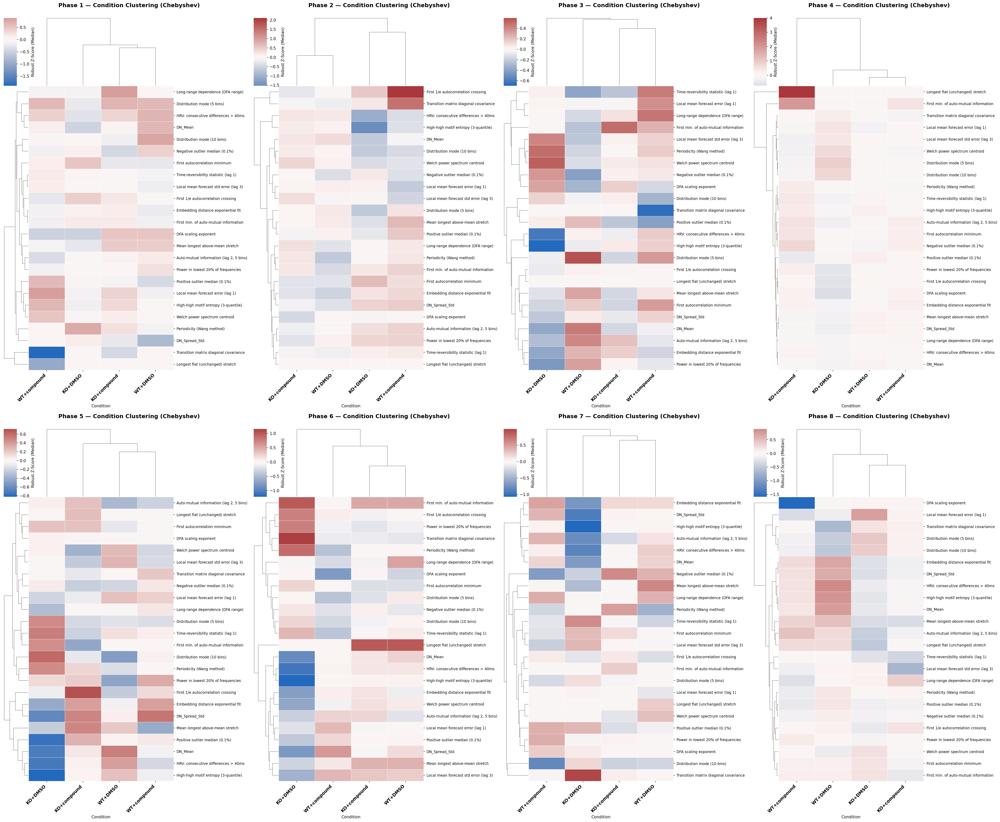


TOP BIOLOGICAL DRIVERS: KO+DMSO vs WT+DMSO
Difference: 1.629 robust units
Feature:    SB_MotifThree_quantile_hh_Phase2
Meaning:    High-high motif entropy (3-quantile)

Difference: 1.319 robust units
Feature:    SB_TransitionMatrix_3ac_sumdiagcov_Phase6
Meaning:    Transition matrix diagonal covariance

Difference: 1.286 robust units
Feature:    MD_hrv_classic_pnn40_Phase2
Meaning:    HRV: consecutive differences > 40ms

Difference: 1.263 robust units
Feature:    SB_MotifThree_quantile_hh_Phase6
Meaning:    High-high motif entropy (3-quantile)

Difference: 1.226 robust units
Feature:    DN_Mean_Phase5
Meaning:    DN_Mean


TOP BIOLOGICAL DRIVERS: WT+DMSO vs KO+compound
Difference: 4.000 robust units
Feature:    SB_BinaryStats_diff_longstretch0_Phase4
Meaning:    Longest flat (unchanged) stretch

Difference: 2.000 robust units
Feature:    IN_AutoMutualInfoStats_40_gaussian_fmmi_Phase4
Meaning:    First min. of auto-mutual information

Difference: 1.000 robust units
Feature:    PD_Perio

In [ ]:
# ============================================================
# Phase-by-Phase Clustermap Visualizer (Optimal Pipeline)
# Features: catch24 | Scaler: Robust | Metric: Chebyshev
# ============================================================

import io
import pycatch22
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display
from sklearn.preprocessing import RobustScaler

# ── FEATURE DESCRIPTIONS ──────────────────────────────────────────────────────
CATCH24_DESCRIPTIONS = {
    "DN_HistogramMode_5":                           "Distribution mode (5 bins)",
    "DN_HistogramMode_10":                          "Distribution mode (10 bins)",
    "CO_f1ecac":                                    "First 1/e autocorrelation crossing",
    "CO_FirstMin_ac":                               "First autocorrelation minimum",
    "CO_HistogramAMI_even_2_5":                     "Auto-mutual information (lag 2, 5 bins)",
    "CO_trev_1_num":                                "Time-reversibility statistic (lag 1)",
    "CO_Embed2_Dist_tau_d_expfit_meandiff":         "Embedding distance exponential fit",
    "IN_AutoMutualInfoStats_40_gaussian_fmmi":      "First min. of auto-mutual information",
    "MD_hrv_classic_pnn40":                         "HRV: consecutive differences > 40ms",
    "SB_BinaryStats_mean_longstretch1":             "Mean longest above-mean stretch",
    "SB_BinaryStats_diff_longstretch0":             "Longest flat (unchanged) stretch",
    "SB_MotifThree_quantile_hh":                    "High-high motif entropy (3-quantile)",
    "SB_TransitionMatrix_3ac_sumdiagcov":           "Transition matrix diagonal covariance",
    "SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1":       "DFA scaling exponent",
    "SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1": "Long-range dependence (DFA range)",
    "SP_Summaries_welch_rect_area_5_1":             "Power in lowest 20% of frequencies",
    "SP_Summaries_welch_rect_centroid":             "Welch power spectrum centroid",
    "FC_LocalSimple_mean1_tauresrat":               "Local mean forecast error (lag 1)",
    "FC_LocalSimple_mean3_stderr":                  "Local mean forecast std error (lag 3)",
    "DN_OutlierInclude_p_001_mdrmd":                "Positive outlier median (0.1%)",
    "DN_OutlierInclude_n_001_mdrmd":                "Negative outlier median (0.1%)",
    "PD_PeriodicityWang_th0_01":                    "Periodicity (Wang method)",
    "mean":                                         "Mean (catch24)",
    "variance":                                     "Variance (catch24)",
}

# ── STEP 1: Feature Extraction (log1p + catch24) ──────────────────────────────
print("Extracting catch24 features...")
sorted_df = full_df.sort_values(by=['loc_coord', 'Group', 'time_sec'])

# Grab feature names dynamically
dummy = pycatch22.catch22_all([0.0, 0.0, 0.0], catch24=True)
base_feature_names = dummy['names']
col_names = [f"{fname}_Phase{p+1}" for p in range(8) for fname in base_feature_names]

all_features, subject_ids, true_labels = [], [], []

for subject, subj_df in sorted_df.groupby('loc_coord'):
    subject_ids.append(subject)
    true_labels.append(subj_df['Condition'].iloc[0])
    
    subject_192 = []
    for _, phase_df in subj_df.groupby('Group'):
        # Apply the optimal log1p transform before extraction to tame massive spikes
        ts = np.log1p(np.clip(phase_df['pxl_diff'].values.astype(float), 0, None))
        subject_192.extend(pycatch22.catch22_all(list(ts), catch24=True)['values'])
        
    all_features.append(subject_192)

feature_matrix = pd.DataFrame(all_features, index=subject_ids, columns=col_names)

# Clean matrix (drop NaNs, infs, zero-variance)
feature_matrix.replace([np.inf, -np.inf], np.nan, inplace=True)
feature_matrix.dropna(axis=1, how='all', inplace=True)
feature_matrix.fillna(0, inplace=True)
feature_matrix = feature_matrix.loc[:, feature_matrix.var(axis=0) >= 1e-6]

print(f"Feature matrix built: {feature_matrix.shape}")

# ── STEP 2: The Winning Scaler (RobustScaler) ─────────────────────────────────
# Scales using median and IQR to completely neutralize extreme outlier fish
scaled_features = RobustScaler().fit_transform(feature_matrix)
scaled_df = pd.DataFrame(scaled_features, index=feature_matrix.index, columns=feature_matrix.columns)
scaled_df['Condition'] = true_labels

# ── STEP 3: Render to Memory Buffer and Stitch ────────────────────────────────
image_buffers = []

print("Generating phase-by-phase Chebyshev clustermaps...")
for phase_idx in range(8):
    phase_num = phase_idx + 1

    # Isolate features for just this phase
    phase_cols = [c for c in feature_matrix.columns if c.endswith(f'_Phase{phase_num}')]
    
    # CALCULATE MEDIAN CENTROIDS: Aligns with RobustScaler logic
    phase_centroids = scaled_df[phase_cols + ['Condition']].groupby('Condition').median()
    
    # Translate column names to English
    phase_centroids.columns = [
        CATCH24_DESCRIPTIONS.get(c.rsplit('_Phase', 1)[0], c.rsplit('_Phase', 1)[0])
        for c in phase_centroids.columns
    ]

    # Generate the map using CHEBYSHEV to isolate the strongest driving signals
    g = sns.clustermap(
        phase_centroids.T,
        method='average',
        metric='chebyshev',
        cmap='vlag',
        center=0,
        figsize=(9, 13),
        col_cluster=True,
        row_cluster=True,
        cbar_kws={'label': 'Robust Z-Score (Median)'},
        dendrogram_ratio=(0.15, 0.2),
        linewidths=0.3,
        linecolor='white',
    )

    plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right', fontsize=11, fontweight='bold')
    plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=9)
    g.fig.suptitle(f"Phase Group {phase_num} — Condition Clustering", fontsize=14, fontweight='bold', y=1.02)
    
    # Save to buffer
    buf = io.BytesIO()
    g.savefig(buf, format='png', bbox_inches='tight', dpi=150)
    plt.close(g.fig) 
    buf.seek(0)
    image_buffers.append(Image.open(buf))

# ── STEP 4: Stitch images into a 2x4 Grid ────────────────────────────────────
img_w, img_h = image_buffers[0].size
grid_img = Image.new('RGB', (img_w * 4, img_h * 2), color='white')

for i, img in enumerate(image_buffers):
    row = i // 4
    col = i % 4
    grid_img.paste(img, (col * img_w, row * img_h))

display(grid_img)
# grid_img.save("Optimal_Chebyshev_Clustermaps.png")


# ── STEP 5: Extract the Top Driving Biology ───────────────────────────────────

def extract_top_driving_features(scaled_dataframe, cond_A, cond_B, top_k=5):
    """Extracts the specific features driving the Chebyshev distance."""
    if cond_A not in scaled_dataframe['Condition'].values or cond_B not in scaled_dataframe['Condition'].values:
        return

    centroid_A = scaled_dataframe[scaled_dataframe['Condition'] == cond_A].drop(columns='Condition').median(axis=0)
    centroid_B = scaled_dataframe[scaled_dataframe['Condition'] == cond_B].drop(columns='Condition').median(axis=0)
    
    abs_diff = np.abs(centroid_A - centroid_B)
    top_features = abs_diff.sort_values(ascending=False).head(top_k)
    
    print(f"\n{'='*70}")
    print(f"TOP BIOLOGICAL DRIVERS: {cond_A} vs {cond_B}")
    print(f"{'='*70}")
    for feat, diff in top_features.items():
        base_feat = feat.rsplit('_Phase', 1)[0]
        desc = CATCH24_DESCRIPTIONS.get(base_feat, base_feat)
        print(f"Difference: {diff:.3f} robust units")
        print(f"Feature:    {feat}")
        print(f"Meaning:    {desc}\n")

# Run the extraction for the two most critical comparisons
extract_top_driving_features(scaled_df, "KO+DMSO", "WT+DMSO", top_k=5)
extract_top_driving_features(scaled_df, "WT+DMSO", "KO+compound", top_k=5)